<a href="https://colab.research.google.com/github/v-enigma/Amazon/blob/main/Musicgeneration_rnn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!sudo apt install -y fluidsynth
!pip install --upgrade pyfluidsynth
!pip install pretty_midi



Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libx

In [ ]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pathlib
import pandas as pd
import pretty_midi
import seaborn as sns
import tensorflow as tf

from IPython import display
from matplotlib import pyplot as plt
from typing import Dict, List, Optional, Sequence, Tuple


seed = 1701
tf.random.set_seed(seed)
np.random.seed(seed)

# Sampling rate for audio playback
_SAMPLING_RATE = 44100



# **Download the data set**

In [ ]:


data_dir = pathlib.Path('data/bach')
if not data_dir.exists():
  tf.keras.utils.get_file(
      'chopin.zip',
      origin='https://cloudyskies.s3.ap-southeast-2.amazonaws.com/chopin.zip',
      extract=True,
      cache_dir='.', cache_subdir='data',
  )



315789/315789 ━━━━━━━━━━━━━━━━━━━━ 1s 2us/step


In [ ]:


filenames = glob.glob(str('data/*/*.mid*'))
print('Number of files:', len(filenames))



Number of files: 48


In [ ]:
sample_file = filenames[1]
print(sample_file)
pm = pretty_midi.PrettyMIDI(sample_file)

data/chopin_extracted/chpn-p16.mid


In [ ]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=60):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

In [ ]:


display_audio(pm)



In [ ]:
print('Number of instruments:', len(pm.instruments))
instrument = pm.instruments[0]
instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
for instrument in pm.instruments:
  name = pretty_midi.program_to_instrument_name(instrument.program)
  print('Instrument name:', name)

Number of instruments: 2
Instrument name: Acoustic Grand Piano
Instrument name: Acoustic Grand Piano


You will use three variables to represent a note when training the model: pitch, step and duration. The pitch is the perceptual quality of the sound as a MIDI note number. The step is the time elapsed from the previous note or start of the track. The duration is how long the note will be playing in seconds and is the difference between the note end and note start times.

In [ ]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [ ]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,63,0.001509,0.694568,0.000000,0.693059
1,69,0.090558,0.694568,0.089049,0.604010
2,78,0.181116,0.720923,0.090558,0.539807
3,69,0.694568,1.116242,0.513452,0.421674
4,63,0.694568,1.116242,0.000000,0.421674


In [ ]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

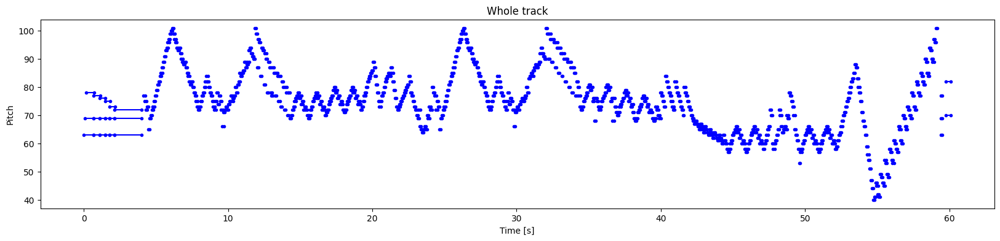

In [ ]:


plot_piano_roll(raw_notes)



In [ ]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))

  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

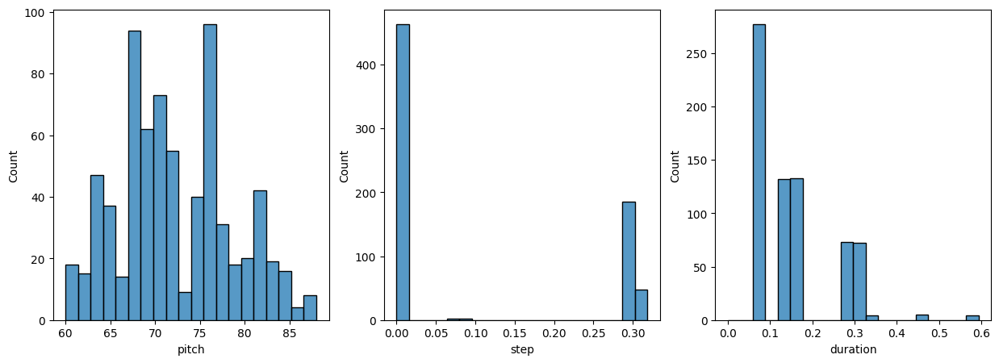

In [ ]:
plot_distributions(raw_notes)

In [ ]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str,
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

In [ ]:
num_files = 48
all_notes = []
for f in filenames[:num_files]:
  try:
    notes = midi_to_notes(f)
    all_notes.append(notes)
  except Exception as e:
      print(f'Skipping MIDI file {f}: {e}')
      continue
    # process the MIDI data
  print(f'Processing MIDI file {f}')
  print(len(all_notes))
print('Finished processing MIDI files')
all_notes = pd.concat(all_notes)
print(len(all_notes))

Processing MIDI file data/chopin_extracted/chpn-p10.mid
1
Processing MIDI file data/chopin_extracted/chpn-p16.mid
2
Processing MIDI file data/chopin_extracted/chpn_op10_e12.mid
3
Processing MIDI file data/chopin_extracted/chpn-p9.mid
4
Processing MIDI file data/chopin_extracted/chpn_op23.mid
5
Processing MIDI file data/chopin_extracted/chpn-p20.mid
6
Processing MIDI file data/chopin_extracted/chpn_op33_4.mid
7
Processing MIDI file data/chopin_extracted/chpn-p12.mid
8
Processing MIDI file data/chopin_extracted/chp_op31.mid
9
Processing MIDI file data/chopin_extracted/chpn-p7.mid
10
Processing MIDI file data/chopin_extracted/chpn_op25_e11.mid
11
Processing MIDI file data/chopin_extracted/chpn-p4.mid
12
Processing MIDI file data/chopin_extracted/chpn-p14.mid
13
Processing MIDI file data/chopin_extracted/chp_op18.mid
14
Processing MIDI file data/chopin_extracted/chpn_op53.mid
15
Processing MIDI file data/chopin_extracted/chpn-p8.mid
16
Processing MIDI file data/chopin_extracted/chpn_op35_4

In [ ]:


n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)



Number of notes parsed: 40305


In [ ]:


all_notes.head(760)



,pitch,start,end,step,duration
0,92,0.750000,0.811350,0.000000,0.061350
1,93,0.811350,0.872699,0.061350,0.061350
2,92,0.872699,0.934049,0.061350,0.061350
3,93,0.934049,0.995399,0.061350,0.061350
4,92,0.995399,1.056748,0.061350,0.061350
...,...,...,...,...,...
594,57,49.663528,49.754967,0.079254,0.091438
595,58,49.741935,49.833157,0.078407,0.091222
596,60,49.820125,49.911171,0.078190,0.091046
597,61,49.898175,49.989043,0.078049,0.090868


In [ ]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

In [ ]:
train_notes[:10]

array([[9.20000000e+01, 0.00000000e+00, 6.13496667e-02],
       [9.30000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.20000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.30000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.20000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.10000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.70000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.20000000e+01, 0.00000000e+00, 6.13496667e-02],
       [9.30000000e+01, 6.13496667e-02, 6.13496667e-02],
       [9.20000000e+01, 6.13496667e-02, 6.13496667e-02]])

In [ ]:


notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec



TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [ ]:
def create_sequences(
    dataset: tf.data.Dataset,
    seq_length: int,
    vocab_size = 128,
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

In [ ]:
seq_length = 50
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [ ]:
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (50, 3)
sequence elements (first 10): tf.Tensor(
[[0.71875    0.         0.06134967]
 [0.7265625  0.06134967 0.06134967]
 [0.71875    0.06134967 0.06134967]
 [0.7265625  0.06134967 0.06134967]
 [0.71875    0.06134967 0.06134967]
 [0.7109375  0.06134967 0.06134967]
 [0.7578125  0.06134967 0.06134967]
 [0.71875    0.         0.06134967]
 [0.7265625  0.06134967 0.06134967]
 [0.71875    0.06134967 0.06134967]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=92.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.0>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.06060599999999994>}


In [ ]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [ ]:
train_ds.element_spec

(TensorSpec(shape=(64, 50, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.float64, name=None)})

**Create and train the model**

In [ ]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

In [ ]:
input_shape = (seq_length, 3)
learning_rate = 0.005

inputs = tf.keras.Input(input_shape)
x = tf.keras.layers.LSTM(128)(inputs)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(x),
  'step': tf.keras.layers.Dense(1, name='step')(x),
  'duration': tf.keras.layers.Dense(1, name='duration')(x),
}

model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer)

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 50, 3)          │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lstm (LSTM)               │ (None, 128)            │         67,584 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ duration (Dense)          │ (None, 1)              │            129 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ pitch (Dense)             │ (None, 128)            │         16,512 │ lstm[0][0]             │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ step (Dense)              │ (None, 1)              │            129 │ lstm[0][0]             │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 84,354 (329.51 KB)

 Trainable params: 84,354 (329.51 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
losses = model.evaluate(train_ds, return_dict=True)
losses

628/628 ━━━━━━━━━━━━━━━━━━━━ 18s 19ms/step - duration_loss: 0.2405 - loss: 5.3794 - pitch_loss: 4.8486 - step_loss: 0.2902


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:151: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


{'duration_loss': 0.23877674341201782,
 'loss': 5.457131385803223,
 'pitch_loss': 4.840981960296631,
 'step_loss': 0.3773673474788666}

In [ ]:


model.compile(
    loss=loss,
    loss_weights={
      'pitch': 0.05,
      'step': 0.7,
      'duration':0.7,
    },
    optimizer=optimizer,
)



In [ ]:


model.evaluate(train_ds, return_dict=True)



628/628 ━━━━━━━━━━━━━━━━━━━━ 12s 18ms/step - duration_loss: 0.2405 - loss: 0.6140 - pitch_loss: 4.8486 - step_loss: 0.2902


{'duration_loss': 0.23877674341201782,
 'loss': 0.6733502745628357,
 'pitch_loss': 4.840981960296631,
 'step_loss': 0.3773673474788666}

In [ ]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}.weights.h5',
        save_weights_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=5,
        verbose=1,
        restore_best_weights=True),
]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
%%time
epochs = 50

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 33s 49ms/step - duration_loss: 0.1133 - loss: 0.4298 - pitch_loss: 3.9414 - step_loss: 0.2191
Epoch 2/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step - duration_loss: 0.1012 - loss: 0.3927 - pitch_loss: 3.5941 - step_loss: 0.2030
Epoch 3/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step - duration_loss: 0.0988 - loss: 0.3747 - pitch_loss: 3.3773 - step_loss: 0.1953
Epoch 4/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - duration_loss: 0.0952 - loss: 0.3615 - pitch_loss: 3.2179 - step_loss: 0.1913
Epoch 5/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 31s 49ms/step - duration_loss: 0.0935 - loss: 0.3570 - pitch_loss: 3.1707 - step_loss: 0.1901
Epoch 6/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 41s 49ms/step - duration_loss: 0.0899 - loss: 0.3495 - pitch_loss: 3.1387 - step_loss: 0.1853
Epoch 7/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 31s 50ms/step - duration_loss: 0.0879 - loss: 0.3447 - pitch_loss: 3.1189 - step_loss: 0.1817
Epoch 8/50
628/628 ━━━━━━━━━━━━━━━━━━━━ 32s 51ms/step - durati

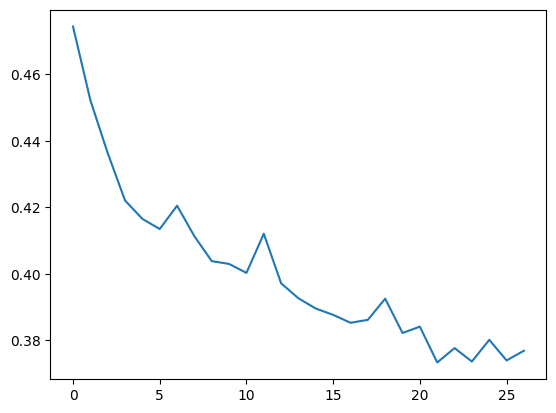

In [ ]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()

In [ ]:
def predict_next_note(
    notes: np.ndarray,
    keras_model: tf.keras.Model,
    temperature: float = 1.0) -> int:
  """Generates a note IDs using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # `step` and `duration` values should be non-negative
  step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

In [ ]:
temperature = 5
num_predictions = 50

sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)

# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[:seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━

In [ ]:
out_file = 'output1.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name='Acoustic Grand Piano')
display_audio(out_pm)

In [ ]:
#from google.colab import files
#files.download(out_file)

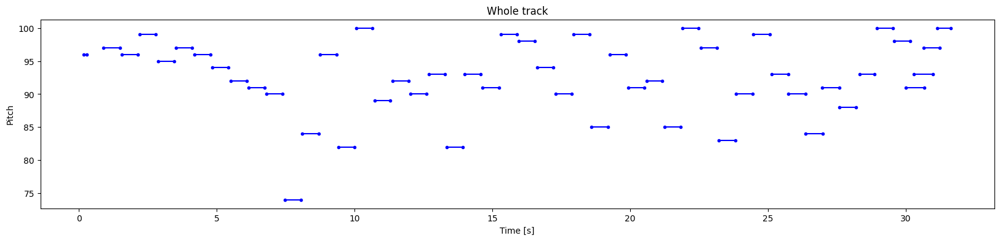

In [ ]:
plot_piano_roll(generated_notes)